<a href="https://colab.research.google.com/github/Vishnu-Jagadeesan/Animated-login-screen/blob/main/pothHoleTraining.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install kaggle

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Download Kaggle Dataset using API

In [ ]:
!kaggle datasets download farzadnekouei/pothole-image-segmentation-dataset

Dataset URL: https://www.kaggle.com/datasets/farzadnekouei/pothole-image-segmentation-dataset
License(s): apache-2.0
 98% 58.0M/59.3M [00:03<00:00, 23.9MB/s]
100% 59.3M/59.3M [00:03<00:00, 16.7MB/s]


In [ ]:
!unzip /content/pothole-image-segmentation-dataset.zip

Archive:  /content/pothole-image-segmentation-dataset.zip
  inflating: Pothole_Segmentation_YOLOv8/README.dataset.txt  
  inflating: Pothole_Segmentation_YOLOv8/README.roboflow.txt  
  inflating: Pothole_Segmentation_YOLOv8/data.yaml  
  inflating: Pothole_Segmentation_YOLOv8/sample_video.mp4  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.49882cdb272111f43a6656b1494a4918.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.8d95dd1d29760a2634a45cc7fdd84b31.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.e238c9bf3fe82e8ac55b0014a27fc529.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.1d433d21e11d000b6b498eacb88fe4a9.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.500c683a687e403f4cdade4826a84b5b.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.5a901c212d899a7dc7dc78be7de892c0.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1

In [ ]:
!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install seaborn
!pip install ultralytics
!pip install opencv-python
!pip install Pillow
!pip install pyyaml


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 915.3/915.3 kB 51.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 88.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
from ultralytics import YOLO
import cv2
from PIL import Image
import yaml
import random


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
sns.set(rc={'axes.facecolor': '#ffe4de'}, style='darkgrid')

# Plot The Images

In [ ]:
dataDir ='/content/Pothole_Segmentation_YOLOv8/'
#dataDir = r"E:\jupyternotebookprj\prj\data\Pothole_Segmentation_YOLOv8"
#dataDir = "/content/drive/MyDrive/BlindAssistant/data/Pothole_Segmentation_YOLOv8"

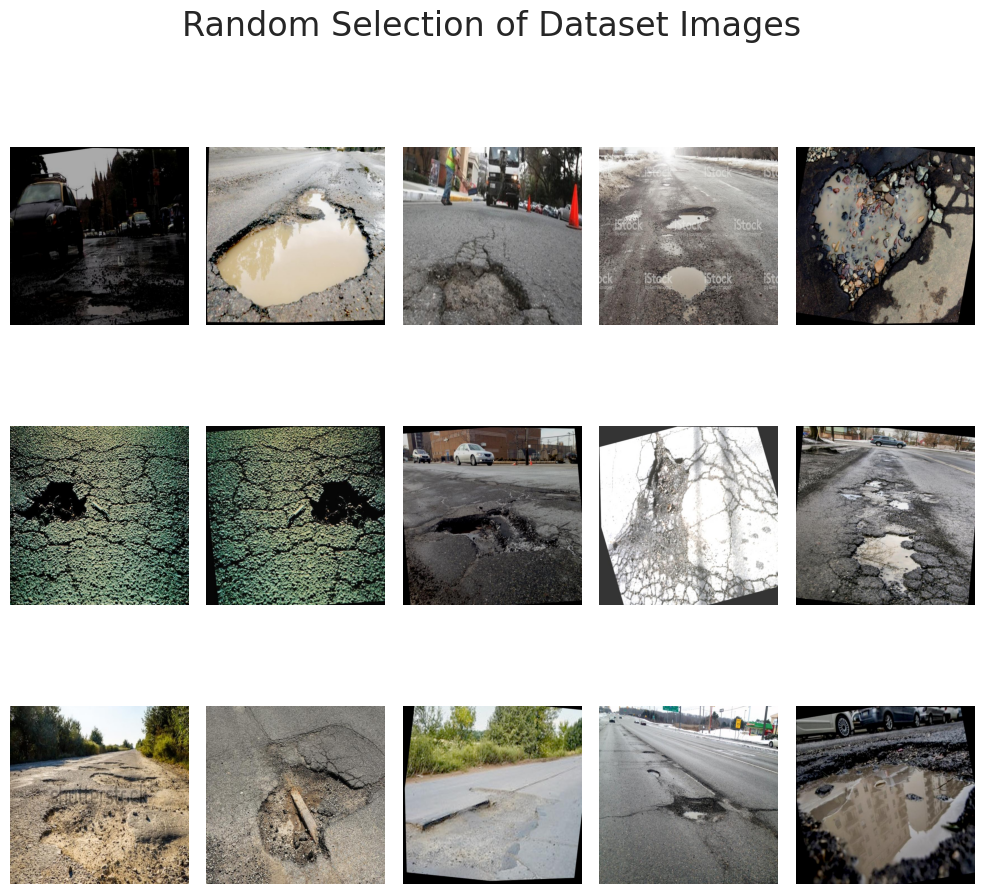

In [ ]:
trainImagePath = os.path.join(dataDir, 'train','images')
#lisst the images
imageFiles = [f for f in os.listdir(trainImagePath) if f.endswith('.jpg')]
randomImages = random.sample(imageFiles, 15)
plt.figure(figsize=(10,10))
for i, image_file in enumerate(randomImages):

    image_path =os.path.join(trainImagePath, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')
    #add a suptitle
plt.suptitle('Random Selection of Dataset Images', fontsize=24)

 #show the plot
plt.tight_layout()
plt.show()

# Train YOLOv8 Segmentation Model

In [ ]:
model = YOLO('yolov8n-seg.pt')

100%|██████████| 6.74M/6.74M [00:00<00:00, 131MB/s]


In [ ]:
yamlFilePath = os.path.join(dataDir, 'data.yaml')

In [ ]:
results = model.train(
    data = yamlFilePath,
    epochs = 30,
    imgsz=640,
    batch=16,
    optimizer ='auto',
    lr0=0.0001,   #intializing intital learning rate
    lrf=0.01,     #Final learning rate (lr0 *lrf)
    dropout=0.25, #Using dropout regularization
    device=0,     #Device to run on, i.e. cuda device =0
    seed=42,
    # amp=True #which enable mixed precision
)

Ultralytics 8.3.77 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/Pothole_Segmentation_YOLOv8/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.25, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, sh

100%|██████████| 755k/755k [00:00<00:00, 83.1MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 369MB/s]


AMP: checks passed ✅


train: Scanning /content/Pothole_Segmentation_YOLOv8/train/labels... 720 images, 0 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:01<00:00, 566.21it/s]

train: New cache created: /content/Pothole_Segmentation_YOLOv8/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Pothole_Segmentation_YOLOv8/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 236.55it/s]

val: New cache created: /content/Pothole_Segmentation_YOLOv8/valid/labels.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/30       2.7G      1.471      2.976      2.343      1.442         47        640: 100%|██████████| 45/45 [00:23<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         60        201      0.688     0.0597      0.116     0.0498      0.702     0.0351      0.115     0.0384



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.63G      1.488      2.531       1.93       1.46         75        640: 100%|██████████| 45/45 [00:17<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         60        201      0.283      0.208      0.151     0.0646      0.262      0.189      0.135     0.0533



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.65G       1.49       2.46      1.731      1.445         86        640: 100%|██████████| 45/45 [00:17<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.53it/s]

                   all         60        201      0.312      0.398      0.292      0.128      0.307      0.393      0.293      0.142



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.57G      1.476      2.404      1.641      1.429         81        640: 100%|██████████| 45/45 [00:16<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.01it/s]

                   all         60        201      0.485      0.408      0.391      0.201      0.499      0.393      0.382      0.181



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.63G      1.436      2.373      1.544      1.403         71        640: 100%|██████████| 45/45 [00:16<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         60        201      0.419      0.493      0.422       0.21      0.444      0.502      0.412      0.198



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.62G        1.4      2.316      1.455      1.377         83        640: 100%|██████████| 45/45 [00:17<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all         60        201      0.487      0.473      0.466      0.215      0.459      0.448      0.437      0.183



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.62G      1.391      2.291      1.438      1.379         48        640: 100%|██████████| 45/45 [00:16<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         60        201      0.619      0.573      0.601      0.319      0.589      0.599      0.574      0.312



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.65G      1.396      2.231      1.366      1.368         75        640: 100%|██████████| 45/45 [00:16<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         60        201      0.632      0.592      0.585      0.304      0.621      0.577      0.559      0.281



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.62G      1.352      2.231       1.33      1.345         63        640: 100%|██████████| 45/45 [00:17<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all         60        201      0.597      0.582      0.601      0.317      0.618      0.617       0.62      0.314



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.63G      1.362      2.149      1.264      1.351         51        640: 100%|██████████| 45/45 [00:16<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]

                   all         60        201      0.655      0.562      0.627      0.335      0.631      0.567      0.626       0.33



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.63G      1.305      2.131      1.244       1.32         68        640: 100%|██████████| 45/45 [00:16<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         60        201      0.605      0.595      0.603      0.331      0.582      0.596      0.594      0.313



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.54G      1.266      2.094      1.207      1.296         87        640: 100%|██████████| 45/45 [00:17<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         60        201       0.63      0.644      0.646      0.358       0.64      0.654      0.643      0.331



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.66G      1.265      2.036      1.133       1.27         78        640: 100%|██████████| 45/45 [00:16<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         60        201      0.755       0.49      0.616      0.333      0.748      0.473      0.605      0.318



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.57G      1.249      1.998      1.108      1.261         72        640: 100%|██████████| 45/45 [00:16<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.42it/s]

                   all         60        201      0.784      0.541      0.685      0.394      0.777      0.552      0.678      0.389



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/30       2.6G      1.221      1.971      1.049      1.248        100        640: 100%|██████████| 45/45 [00:17<00:00,  2.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.84it/s]

                   all         60        201      0.765      0.552      0.677      0.381      0.778      0.557      0.673      0.381



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.62G      1.192      1.901      1.025      1.224         62        640: 100%|██████████| 45/45 [00:16<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.85it/s]

                   all         60        201      0.707      0.632      0.681      0.404      0.712      0.637      0.689      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.64G      1.177      1.878     0.9839      1.209         63        640: 100%|██████████| 45/45 [00:16<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]

                   all         60        201      0.654      0.637      0.634      0.349      0.682      0.647      0.652      0.348



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.64G      1.162      1.872     0.9904      1.211         57        640: 100%|██████████| 45/45 [00:17<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all         60        201      0.635      0.657      0.662      0.389      0.663      0.637      0.679      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.62G      1.147      1.851     0.9607      1.197         58        640: 100%|██████████| 45/45 [00:16<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         60        201      0.703      0.622      0.681       0.42      0.723      0.637      0.698      0.383



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.66G      1.133      1.834     0.9458      1.198         60        640: 100%|██████████| 45/45 [00:16<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.50it/s]

                   all         60        201      0.647      0.701      0.691      0.424      0.656      0.716      0.719      0.406


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.52G      1.103      1.801     0.9026      1.183         39        640: 100%|██████████| 45/45 [00:19<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.57it/s]

                   all         60        201      0.741      0.607      0.665      0.385      0.733      0.617      0.664      0.368



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.54G       1.07      1.716     0.8158      1.186         29        640: 100%|██████████| 45/45 [00:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         60        201      0.688      0.626      0.687      0.425      0.745      0.597      0.702      0.412



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.55G      1.038      1.653     0.7778      1.139         36        640: 100%|██████████| 45/45 [00:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.67it/s]

                   all         60        201      0.653      0.692      0.712      0.451      0.811      0.587      0.717      0.426



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/30       2.6G      1.022      1.632     0.7364      1.135         31        640: 100%|██████████| 45/45 [00:15<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         60        201      0.708      0.674      0.714      0.456      0.735      0.697      0.746      0.429



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.54G      0.987      1.595     0.7158      1.109         41        640: 100%|██████████| 45/45 [00:15<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         60        201      0.702      0.637      0.691      0.439      0.725      0.657      0.723       0.42



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.59G     0.9961      1.594     0.7008      1.112         35        640: 100%|██████████| 45/45 [00:15<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]

                   all         60        201      0.695      0.677      0.719      0.436      0.705      0.706       0.74      0.422



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.55G     0.9863      1.576     0.6998      1.104         37        640: 100%|██████████| 45/45 [00:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         60        201      0.694      0.677      0.722      0.443      0.704      0.687      0.742      0.427



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.61G     0.9475       1.53     0.6724      1.092         25        640: 100%|██████████| 45/45 [00:14<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.79it/s]

                   all         60        201      0.683      0.701      0.736      0.477      0.692      0.716       0.75      0.446



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.59G     0.9182      1.503     0.6266       1.07         42        640: 100%|██████████| 45/45 [00:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.56it/s]

                   all         60        201      0.756      0.677      0.748       0.47      0.767      0.687      0.758      0.444



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.57G     0.9033      1.503     0.6284      1.071         41        640: 100%|██████████| 45/45 [00:15<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         60        201      0.698      0.713      0.755      0.472      0.806      0.661      0.775       0.46



30 epochs completed in 0.155 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.8MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.77 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.15it/s]


                   all         60        201      0.698      0.712      0.755      0.472      0.794       0.67      0.776       0.46
Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/segment/train


In [ ]:
import torch
torch.cuda.empty_cache()

In [ ]:
#make the inferences on images
bestModelPath = '/content/runs/segment/train/weights/best.pt'
bestmodel = YOLO(bestModelPath)


image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-69-_jpg.rf.0fcb6cd22beb140d931a387036b7eab6.jpg: 640x640 14 Potholes, 9.4ms
Speed: 2.0ms preprocess, 9.4ms inference, 12.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-33-_jpg.rf.143c56d136e3245555b26b4d5108a4e1.jpg: 640x640 6 Potholes, 9.4ms
Speed: 1.8ms preprocess, 9.4ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-116-_jpg.rf.ddcb9d0e0bcf2a1a5096c4f04e6b7f9e.jpg: 640x640 12 Potholes, 9.4ms
Speed: 1.7ms preprocess, 9.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-183-_jpg.rf.277cfed19f046acc63dc9640b239f1df.jpg: 640x640 1 Pothole, 9.4ms
Speed: 1.7ms preprocess, 9.4ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/vali

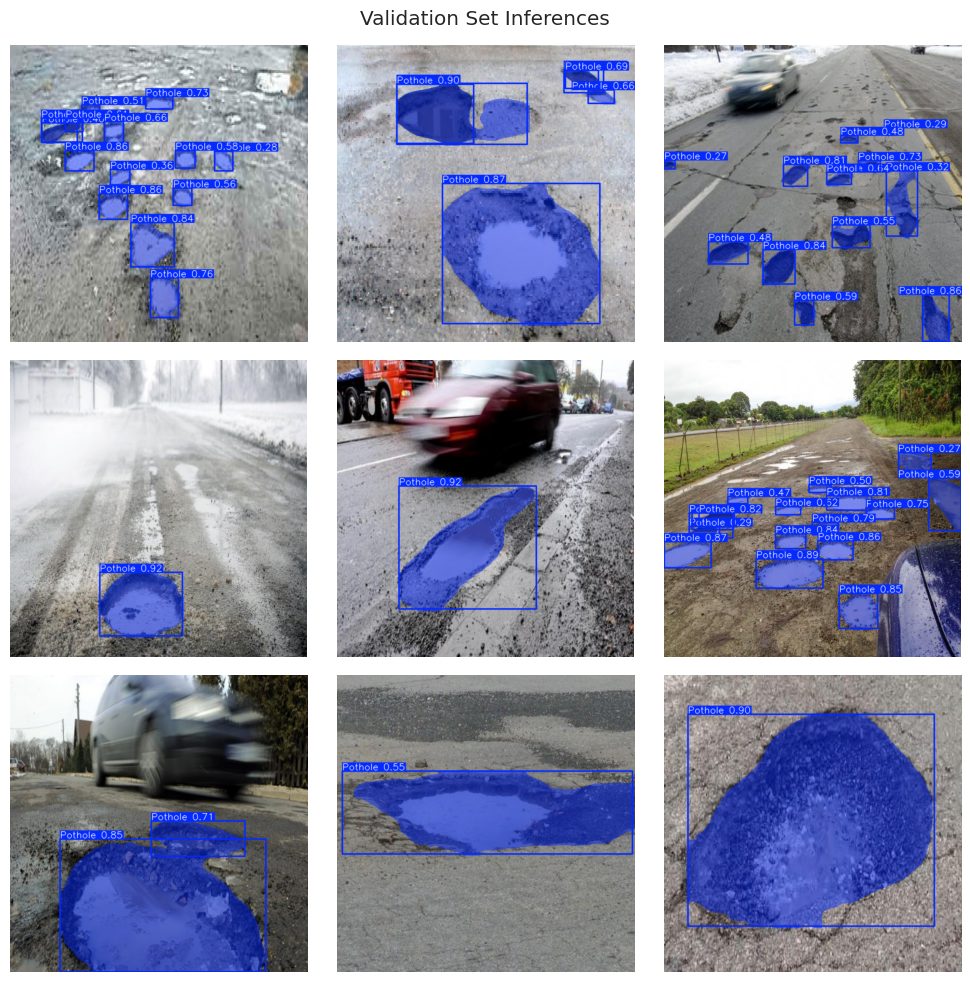

In [ ]:
validImagePath = os.path.join(dataDir, 'valid', 'images')
imageFiles = [f for f in os.listdir(validImagePath) if f.endswith('.jpg')]
#select ARndom Images
numImages = len(imageFiles)
selectedImage = [imageFiles[i] for i in range(0, numImages, numImages // 9)]
fig, axes = plt.subplots(3,3, figsize=(10,10))
fig.suptitle('Validation Set Inferences')


for i, ax in enumerate(axes.flatten()):
    imagePath = os.path.join(validImagePath, selectedImage[i])
    results =bestmodel.predict(source= imagePath, imgsz=640)
    annotatedImage = results[0].plot()
    annotatedImageRGB =cv2.cvtColor(annotatedImage, cv2.COLOR_BGR2RGB)
    ax.imshow(annotatedImageRGB)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
#Make the inference on video
import shutil
videoPath ='/content/Pothole_Segmentation_YOLOv8/sample_video.mp4'
bestmodel.predict(source = videoPath, save = True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 60.8ms
video 1/1 (frame 2/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 2 Potholes, 9.6ms
video 1/1 (frame 3/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 9.0ms
video 1/1 (frame 4/375) /content/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 8.5ms
video 1/1 (frame 5/375) /content/Po

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'Pothole'}
 obb: None
 orig_img: array([[[146, 137, 129],
         [177, 168, 160],
         [178, 169, 161],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[197, 188, 180],
         [206, 197, 189],
         [164, 155, 147],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[150, 141, 133],
         [183, 174, 166],
         [188, 179, 171],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        ...,
 
        [[ 80,  92, 102],
         [ 70,  82,  92],
         [ 63,  75,  85],
         ...,
         [ 61,  81, 101],
         [ 62,  82, 102],
         [ 65,  85, 105]],
 
        [[ 70,  82,  92],
         [ 63,  75,  85],
         [ 59,  71,  8

In [ ]:
import subprocess
#convert AVI to MP4 using FFmpeg
subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', '/content/runs/segment/predict/sample_video.avi', 'output_video.mp4'])

from IPython.display import Video

#display te converted MP$ video
Video("output_video.mp4", embed=True, width=960)

#Acuracy of the trained model

In [ ]:
results = bestmodel.val()

Ultralytics 8.3.77 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/Pothole_Segmentation_YOLOv8/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.24s/it]


                   all         60        201      0.698      0.713      0.755      0.472      0.805      0.658      0.774      0.459
Speed: 13.9ms preprocess, 18.2ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to runs/segment/val


In [ ]:
print(results)

ultralytics.utils.metrics.SegmentMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c1c180e6810>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(M)', 'F1-Confidence(M)', 'Precision-Confidence(M)', 'Recall-Confidence(M)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041, 

In [ ]:
# Example: accessing mAP metrics
mAP50 = results.maps[0]
if len(results.maps) > 1:
    mAP50_95 = results.maps[1]
else:
    mAP50_95 = None  # or some other default value
print(f"mAP50: {mAP50}")
print(f"mAP50-95: {mAP50_95}")


mAP50: 0.9314917166179664
mAP50-95: None


Index(['epoch', 'time', 'train/box_loss', 'train/seg_loss', 'train/cls_loss',
       'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)',
       'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'metrics/precision(M)',
       'metrics/recall(M)', 'metrics/mAP50(M)', 'metrics/mAP50-95(M)',
       'val/box_loss', 'val/seg_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')


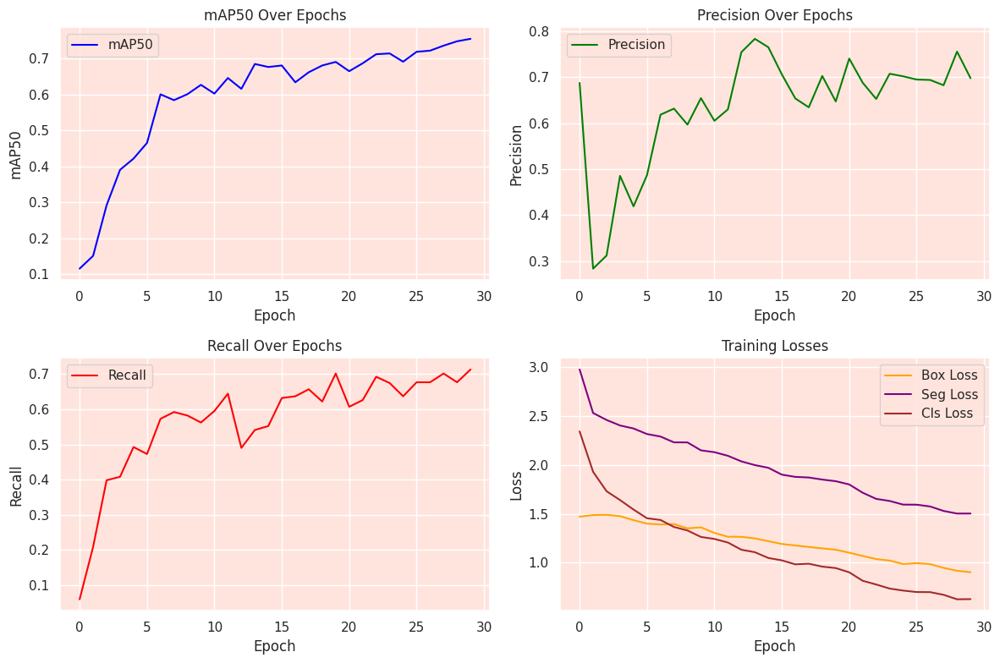

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the results file
results_path = '/content/runs/segment/train/results.csv'  # Update this path if necessary
results = pd.read_csv(results_path)

# Print the available columns to check their exact names
print(results.columns)

# Plot metrics
plt.figure(figsize=(12, 8))

# Plot mAP50 (mean Average Precision at IoU 0.5) - adjust column name if needed
plt.subplot(2, 2, 1)
# Replace '   metrics/mAP50(B)' with the actual column name from the printed output
plt.plot(results['metrics/mAP50(B)'], label='mAP50', color='blue')
plt.title('mAP50 Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('mAP50')
plt.legend()

# Plot Precision - adjust column name if needed
plt.subplot(2, 2, 2)
# Replace '      metrics/precision(B)' with the actual column name
plt.plot(results['metrics/precision(B)'], label='Precision', color='green')
plt.title('Precision Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.legend()

# Plot Recall - adjust column name if needed
plt.subplot(2, 2, 3)
# Replace '         metrics/recall(B)' with the actual column name
plt.plot(results['metrics/recall(B)'], label='Recall', color='red')
plt.title('Recall Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend()

# Plot Losses - adjust column names if needed
plt.subplot(2, 2, 4)
# Replace column names with actual names if they differ
plt.plot(results['train/box_loss'], label='Box Loss', color='orange')
plt.plot(results['train/seg_loss'], label='Seg Loss', color='purple')
plt.plot(results['train/cls_loss'], label='Cls Loss', color='brown')
plt.title('Training Losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()